# Intrinsic analysis of cycling network data

**Input files of this notebook:**
* `../config.yml`
* `../data/ref_{study_area}.graphml`
* `../data/ref_{study_area}_simple.graphml`
* `../data/ref_nodes_{study_area}.pickle`
* `../data/ref_edges_{study_area}.pickle`
* `../data/ref_nodes_simplified_{study_area}.pickle`
* `../data/ref_edges_simplified_{study_area}.pickle`
* `../data/ref_nodes_joined_{study_area}.pickle`
* `../data/ref_edges_joined_{study_area}.pickle`
* `../data/ref_nodes_simplified_joined_{study_area}.pickle`
* `../data/ref_edges_simplified_joined_{study_area}.pickle`
* `../data/grid_{study_area}.gpkg`

**Output files of this notebook:**
* `../results/ref_instrinsic_analysis_{study_area}.json`
* `../results/grid_results_intrinsic_{study_area}.pickle`

**Overview**

This notebook analyses the quality of reference data on cycling infrastructure for a given area. The quality assessment is **intrisic**, i.e. based only on the input data set, and making no use of information external to the data set. (For an extrinsic quality assessment that compares the reference data set to OSM data for the same area, see the next three notebooks `03a`, `03b` and `03c`)

The purpose of the analysis is to assess the *fitness for use* of the data for a given area. Outcomes of the analysis can be relevant both for cycling planning and research - particularly for projects that include a network analysis of cycling infrastructure, in which case the topology of the geometries is of particular importance.

Since the assesment do not make use of another external reference dataset as the ground truth, no universal claims of data quality can be made. The idea is much rather to enable the those working with cycling networks  to assess whether the data is good enough for their particular usecase.

The various steps in the analysis thus attempts to highlight issues that might undermine the quality of analyses based on the data, but leaves the final interpretation of the results to the end user.

The notebook makes use of quality metrics from a range of previous projects investigating spatial data quality, such as [Fester et al. (2020)](https://www.tandfonline.com/doi/full/10.1080/15568318.2018.1519746) and [Barron et al., 2014](https://onlinelibrary.wiley.com/doi/10.1111/tgis.12073).


**For a correct interpretation of some of the metrics for spatial data quality, some familiarity with the area is necessary.**

**Sections:**

1. Load and process data
2. Data completeness
    - Network density (nodes and edges)
3. Network Topology
    - Simplification outcomes 
    - Dangling nodes
    - Overshoots 
    - Undershoots
    - Missing intersections
4. Network components
5. Save results
****

## 1. Load data

In [2]:
import geopandas as gpd
import pandas as pd
import osmnx as ox
import yaml
import numpy as np
import matplotlib.pyplot as plt
import contextily as cx
import json
import pickle
from matplotlib import cm
from matplotlib import colors 
from collections import Counter
import folium
from src import evaluation_functions as ef
from src import plotting_functions as pf

KeyboardInterrupt: 

### Load settings

In [1]:
with open(r'../config.yml') as file:

    parsed_yaml_file = yaml.load(file, Loader=yaml.FullLoader)

    study_area = parsed_yaml_file['study_area']
    study_area_poly_fp = parsed_yaml_file['study_area_poly']
    study_crs = parsed_yaml_file['study_crs']
    
print('Settings loaded!')

NameError: name 'yaml' is not defined

### Load reference data and grid

*(this data is prepared in the 'load_data' notebook)*

In [3]:
# Load simplified and non-simplified graphs
ref_graph = ox.load_graphml(
    f'../data/ref_{study_area}.graphml', 
    edge_dtypes={'cycling_bidirectional': ox.io._convert_bool_string})

ref_simplified_graph = ox.load_graphml(
    f'../data/ref_{study_area}_simple.graphml', 
    edge_dtypes={'cycling_bidirectional': ox.io._convert_bool_string, 
    'infrastructure_length':float})

print('Graphs loaded!')

# Load grid
grid = gpd.read_file(f'../data/grid_{study_area}.gpkg')
grid_ids = grid.grid_id.to_list()

# Load saved edged and nodesß
with open(f'../data/ref_nodes_{study_area}.pickle', 'rb') as fp:
    nodes = pickle.load(fp)

with open(f'../data/ref_edges_{study_area}.pickle', 'rb') as fp:
    edges = pickle.load(fp)

with open(f'../data/ref_nodes_simplified_{study_area}.pickle', 'rb') as fp:
    nodes_simplified = pickle.load(fp)

with open(f'../data/ref_edges_simplified_{study_area}.pickle', 'rb') as fp:
    edges_simplified = pickle.load(fp)

# Joined data
with open(f'../data/ref_nodes_joined_{study_area}.pickle', 'rb') as fp:
    nodes_joined = pickle.load(fp)

with open(f'../data/ref_edges_joined_{study_area}.pickle', 'rb') as fp:
    edges_joined = pickle.load(fp)

with open(f'../data/ref_nodes_simplified_joined_{study_area}.pickle', 'rb') as fp:
    nodes_simp_joined = pickle.load(fp)

with open(f'../data/ref_edges_simplified_joined_{study_area}.pickle', 'rb') as fp:
    edges_simp_joined = pickle.load(fp)

print('Reference data loaded!')

Graphs loaded!
OSM data loaded!


#### Load dictionary of folium TileLayers

In [4]:
folium_layers = {
        'Google Satellite': folium.TileLayer(
                tiles = 'https://mt1.google.com/vt/lyrs=s&x={x}&y={y}&z={z}',
                attr = 'Google',
                name = 'Google Satellite',
                overlay = True,
                control = True,
                show = False
                ),
        'whiteback': folium.TileLayer(
                tiles = 'https://api.mapbox.com/styles/v1/krktalilu/ckrdjkf0r2jt217qyoai4ndws/tiles/256/{z}/{x}/{y}@2x?access_token=pk.eyJ1Ijoia3JrdGFsaWx1IiwiYSI6ImNrcmRqMXdycTB3NG8yb3BlcGpiM2JkczUifQ.gEfOn5ttzfH5BQTjqXMs3w',
                name = 'Background: White',
                attr = 'Mapbox',
                control = True,
                overlay = True,
                show = False
                ),
        'Stamen TonerLite': folium.TileLayer(
                tiles = 'https://stamen-tiles-{s}.a.ssl.fastly.net/toner-lite/{z}/{x}/{y}{r}.png',
                attr = 'Map tiles by <a href="http://stamen.com">Stamen Design</a>, <a href="http://creativecommons.org/licenses/by/3.0">CC BY 3.0</a> &mdash; Map data &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
                name = 'Stamen TonerLite',
                control = True,
                overlay = True,
                show = False
        ), 
        'CyclOSM': folium.TileLayer(
                tiles = 'https://{s}.tile-cyclosm.openstreetmap.fr/cyclosm/{z}/{x}/{y}.png',
                attr = 'Map data &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
                name = 'CyclOSM',
                control = True,
                overlay = True,
                show = False
        ),     
        'OSM': folium.TileLayer(
                tiles = 'openstreetmap', 
                name = 'OpenStreetMap',
                attr = 'Map data &copy; <a href="https://www.openstreetmap.org/copyright">OpenStreetMap</a> contributors',
                control = True, 
                overlay = True
                )
}

__________________

## 2. Data completeness

### Network Density

#### Why?

Network density without comparing to a reference dataset does not in itself indicate spatial data quality. For anyone familiar with the study area, network density can however indicate whether parts of the area appear to be under- or overmapped, and is thus included here.

#### How?

The density here is not based on the geometric length of edges, but instead on the computed length of the infrastructure. For example, a 100 meter long bidirectional path contributes with 200 meters of cycling infrastructure. With `compute_network_density`, we compute the number of elements (nodes; danling nodes; and total infrastructure length) per unit area. The density is computed twice: first for the study area ('global density'), then for each of the grid cells ('local density').

#### What could it mean?

Since the analysis we conduct here is intrinsic, i.e. it makes no use of external information, we cannot know whether a low density value is due to incomplete mapping, or due to actual lack of infrastructure in the area. However, a comparison of the grid cell density values can provide some insights, for example:
* lower-than-average infrastructure density indicates a locally sparser network
* higher-than-average node density indicates a that there are relatively many intersections in the grid cell
* higher-than-average dangling node density indicates that there are relatively many dead ends in the grid cell


In [7]:
# Entire study area
edge_density, node_density, dangling_node_density = ef.compute_network_density(
    (edges_simplified, nodes_simplified),
    grid.unary_union.area, 
    return_dangling_nodes=True
    )

density_results = {}
density_results['edge_density'] = edge_density
density_results['node_density'] = edge_density
density_results['danling_node_density'] = dangling_node_density

print(f'For the entire study area, there are:')
print(f'- {edge_density:.2f} meters of cycling infrastructure per square km')
print(f'- {node_density:.2f} nodes in the cycling network per square km')
print(f'- {dangling_node_density:.2f} dangling nodes in the cycling network per square km')

# Per grid cell
results_dict = {}
data = (edges_simp_joined, nodes_simp_joined.set_index('osmid'))

[ef.run_grid_analysis(
    grid_id, data,
    results_dict, 
    ef.compute_network_density, 
    grid['geometry'].loc[grid.grid_id==grid_id].area.values[0], return_dangling_nodes=True
    ) 
for grid_id in grid_ids];

results_df = pd.DataFrame.from_dict(results_dict, orient='index')
results_df.reset_index(inplace=True)
results_df.rename(columns={'index':'grid_id', 0:'edge_density',1:'node_density',2:'dangling_node_density'}, inplace=True)

# grid = grid.merge(results_df, on='grid_id', how='left')
grid = ef.merge_results(grid,results_df,'left')

For the entire study area, there are:
- 5871.84 meters of cycling infrastructure per square km
- 26.13 nodes in the cycling network per square km
- 9.86 dangling nodes in the cycling network per square km


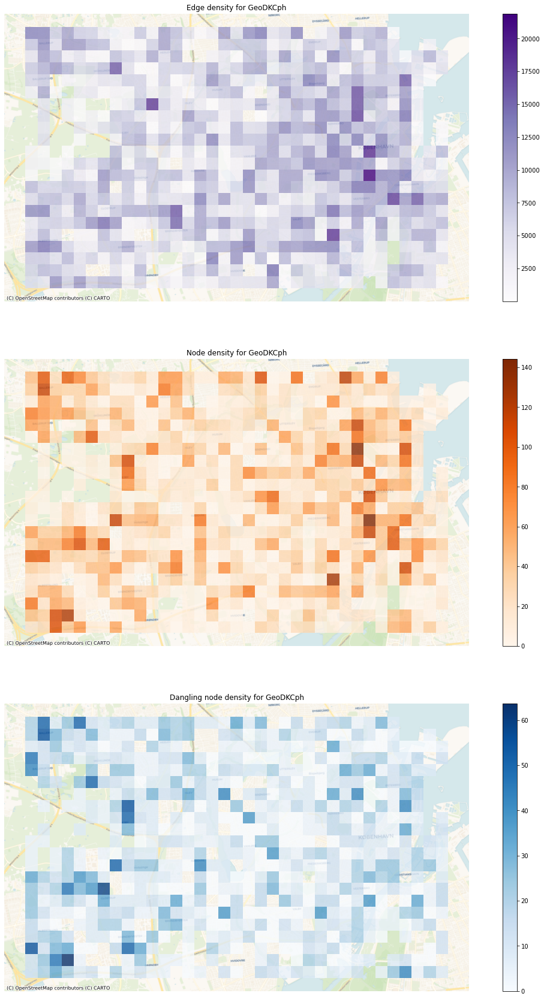

In [8]:
# Network density grid plots

fig, ax = plt.subplots(3,1,figsize=(20,30))

# First subplot: edge density
grid.plot(ax = ax[0], column='edge_density', legend=True, alpha = 0.8, cmap = 'Purples')
cx.add_basemap(ax = ax[0], crs=study_crs, source=cx.providers.CartoDB.Voyager)
ax[0].set_title('Edge density for ' + study_area)
ax[0].set_axis_off()

# Second subplot: node density (nodes of all degrees)
grid.plot(ax = ax[1], column='node_density', legend=True, alpha = 0.8, cmap = 'Oranges')
cx.add_basemap(ax[1], crs=study_crs, source=cx.providers.CartoDB.Voyager)
ax[1].set_title('Node density for ' + study_area)
ax[1].set_axis_off()

# Third subplot: dangling node density (nodes of degree 1)
grid.plot(ax=ax[2], column='dangling_node_density', legend=True, alpha= 0.8, cmap = 'Blues')
cx.add_basemap(ax[2], crs=study_crs, source=cx.providers.CartoDB.Voyager)
ax[2].set_title('Dangling node density for ' + study_area)
ax[2].set_axis_off()

______________________

## 3. Network topology

This section explores the geometric and topological features of the data.

These are, for example, network density, disconnected components, dangling (degree one) nodes; it also includes exploring whether there are nodes in close proximity, that do not share an edge - a potential sign of edge undershoots - or if there are intersecting edges without a node at the intersection, which might indicate a digitizing error that will distort any attempts at routing on the network.

It is important to note that due to the fragmented nature of most networks of cycling infrastructure, many metrics, such as missing links or network gaps, simply reflect the true extent of the infrastructure ([Natera Orozco et al., 2020](https://onlinelibrary.wiley.com/doi/pdfdirect/10.1111/gean.12324)). This is different for car networks, where e.g. disconnected components could more readily be interpreted as a data quality issue.

Therefore, our analysis only takes very small network gaps into account as potential data quality issues.

**Subsections:**
1. Simplification outcomes
2. Network density (nodes and edges)
3. Dangling nodes
4. Network components
5. Snapping issues


### Simplification & graph conversion outcome

When converting a set of geocoded linestrings (polygonal chains) to graph format, not all vertices (nodes) are of equal meaning. For geometry of the infrastructural element, all nodes are needed as an ordered list. For the topology of the network, however, only those nodes that are endpoints or intersection points with other edges are needed, while all other (so-called 'interstitial') nodes do not add any information. In order to compare the structure and true ratio between nodes and edges in a network, a simplified network representation which only includes nodes at endpoints and intersections, or where the value of important attributes changes, is required. Therefore, in the notebook `01_load_data` we already 'simplified' the cycling network by removing all interstitial nodes from the graph object (retaining, however, the complete node lists in the geometry attribute of each edge). An additional advantage of simplifying the network is the resulting substantial reduction of the number of nodes and edges, which makes computational routines much faster.

#### Why?

Comparing the node degree distribution for the networks before and after simplification is a quick sanity check for the simplification routine. Typically, the big majority of nodes in the non-simplified network will be of degree two; in the simplified network, however, most nodes will have degrees other than two. Degree two nodes are retained in only two cases: if they represent a connection point between two different types of infrastructure; or if they are needed in order to avoid self-loops (edges whose start and end points are identical) or multiple edges between the same pair of nodes. 

As part of the simplification routine, in cases where there are several edges between the same pair of nodes ('parallel edges' or 'multiedges'), only one of the edges is retained. Within the routine, we count how many edges are removed in this way. 

#### How?

Below, we print out both the node degree distributions before and after simplification, and the information on parallel edges removed by the simplificaton routine.

#### What could it mean?

Typically, the node degree distribution will go from high (before simplification) to low (after simplification) counts of degree two nodes, while it will not change for all other degrees (1, or 3 and higher). Further, the total number of nodes will see a strong decline. If the simplified graph still maintains a relatively high number of degree two nodes, or if the number of nodes with other degrees changes after the simplification, this might point to issues either with the graph conversion or with the simplification process.

The instances where parallel edges between the same pair of nodes were removed are a potential data quality issue of 'overmapping', where one infrastructure element is represented by several identical or nearly identical features. Alternatively, if many parallel edges are present in the data set, this could point to a problem in the conversion from linestrings to graph format, for example in how nodes are defined.

**// User configurations //**

Note that the choice of attributes used for defining distinct network edges in the simplification function in the [data loading notebook](01_load_data.ipynb) will influence the result of the network simplification function. The more attributes provided, the fewer edges will be merged during the simplification processs.

In [54]:
# Decrease in network elements after simplification
edge_percent_diff = (len(edges) - len(edges_simplified)) / len(edges)*100
node_percent_diff = (len(nodes) - len(nodes_simplified)) / len(nodes)*100

simplification_results = {
    'edge_percent_diff': edge_percent_diff,
    'node_percent_diff': node_percent_diff
    }

print(f'Simplifying the network decreased the number of edges with {edge_percent_diff:.1f}% and the number of nodes with {node_percent_diff:.1f}%')

Simplifying the network decreased the number of edges with 89.0% and the number of nodes with 84.7%


Node degree counts before simplification: Counter({2: 26556, 3: 1794, 1: 1790, 4: 712, 5: 27, 7: 1, 6: 1})
Node degree counts after simplification: Counter({3: 1794, 1: 1790, 4: 712, 2: 415, 5: 27, 7: 1, 6: 1})


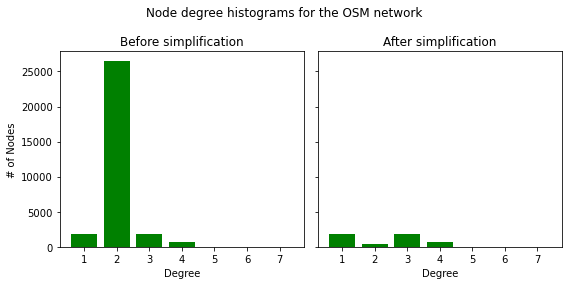

In [55]:
# Node degree distribution

fig, ax = plt.subplots(1, 2, figsize=(8, 4), sharey = True)

degree_sequence_before = sorted((d for n, d in ref_graph.degree()), reverse=True)
degree_sequence_after = sorted((d for n, d in ref_simplified_graph.degree()), reverse=True)

ax[0].bar(*np.unique(degree_sequence_before, return_counts=True), color = 'green')
ax[0].set_title('Before simplification')
ax[0].set_xlabel('Degree')
ax[0].set_ylabel('# of Nodes')

ax[1].bar(*np.unique(degree_sequence_after, return_counts=True), color = 'green')
ax[1].set_title('After simplification')
ax[1].set_xlabel('Degree')

plt.suptitle('Node degree histograms for the reference network')

fig.tight_layout()

print('Node degree counts before simplification:', Counter(degree_sequence_before))
print('Node degree counts after simplification:', Counter(degree_sequence_after))

plt.show()

In [56]:
# Get df and dict of multiedges (removed by simplification routine)

# format: str to int
edges_simplified['multiedge'] = edges_simplified['multiedge'].astype(int)

# get list of multiple edges
multiple_edges = edges_simplified[edges_simplified['multiedge']>0].copy()

# save results to dict (for later json saving)
multiple_edges_results = list(multiple_edges.index)

In [57]:
# Folium plot of multiple edges identified by simplification routine

simplified_edges_folium = pf.make_edgefeaturegroup(
    gdf = edges_simplified,
    mycolor = 'black',
    myweight = 2,
    nametag = 'All edges',
    show_edges = True
)

multiple_edges_folium = pf.make_edgefeaturegroup(
    gdf = multiple_edges,
    myweight = 5,
    mycolor = 'red',
    nametag = 'Multiple edges',
    show_edges = True
)

m = pf.make_foliumplot(
    feature_groups = [
        simplified_edges_folium, 
        multiple_edges_folium
        ],
    layers_dict = folium_layers,
    center_gdf = nodes_simplified,
    center_crs = nodes_simplified.crs
)

m.save('../results/plots/folium_multiple_edges_map_ref.html')

display(m)

### Dangling nodes

#### Why?

Dangling nodes are nodes of degree one - in other words, nodes that have only one single edge attached to them. Most networks will naturally contain a number of dangling nodes. Dangling nodes can occur at actual dead-ends (representing a cul-de-sac), at the endpoints of certain features (e.g. when a bicycle path ends in the middle of a street), or in case of over/undershoots (as described in detail in the next section). The number of dangling nodes in a network does to some extent also depend on the digitization method, as shown in the illustration below. 

Therefore, the presence of dangling nodes is in itself not a sign of low data quality. However, a high number of dangling nodes in an area that is not known for suffering from many dead-ends can indicate digitization errors and problems with edge over/undershoots.

<img src='../images/dangling_nodes_illustration.png' height=200 />  <img src='../images/no_dangling_nodes_illustration.png' height=200 />

*Dangling nodes occur where road features end (left), but when separate features are joined at the end (right), there will be no dangling nodes*

#### How?

Below, we obtain a list of all dangling nodes with the help of `get_dangling_nodes`. Then, we plot the network with all its nodes. The dangling nodes are shown in red, all other nodes are shown in black.

#### What could it mean?

We recommend a visual analysis in order to interpret the spatial distribution of dangling nodes, with particular attention to areas of high dangling node density. It is important to understand where dangling nodes come from: are they actual dead-ends or digitization errors (e.g. over/undershoots)? A higher number of digitization errors points to a lower quality of the data.

<img src='../images/dangling_nodes_illustration.png' height=200 />  <img src='../images/no_dangling_nodes_illustration.png' height=200 />

*Dangling nodes occur where road features end (left), but when separate features are joined at the end (right), there will be no dangling nodes*

<img src='../images/overshoot_illustration.png' height=200 />  <img src='../images/undershoot_illustration.png' height=200 />

*Overshoots refer to situations where a line feature extends too far beyond at intersecting line, rather than ending at the intersection (left).* 
*Undershoots happen when two line features are not properly joined, for example at intersection (right)*

#### Dangling nodes

In [58]:
# Compute number of dangling nodes 
dangling_nodes = ef.get_dangling_nodes(edges_simplified, nodes_simplified)

In [59]:
# Folium plot of dangling nodes

edges_simplified_folium = pf.make_edgefeaturegroup(
    gdf = edges_simplified,
    mycolor = 'black',
    myweight = 2,
    nametag = 'edges',
    show_edges = True
)

nodes_simplified_folium = pf.make_nodefeaturegroup(
    gdf = nodes_simplified,
    mysize = 1,
    mycolor = 'black',
    nametag = 'other nodes',
    show_nodes = True
)

dangling_nodes_folium = pf.make_nodefeaturegroup(
    gdf = dangling_nodes,
    mysize = 2,
    mycolor = 'red',
    nametag = 'dangling nodes',
    show_nodes = True
)

m = pf.make_foliumplot(
    feature_groups = [
        edges_simplified_folium, 
        nodes_simplified_folium, 
        dangling_nodes_folium],
    layers_dict = folium_layers,
    center_gdf = nodes_simplified,
    center_crs = nodes_simplified.crs
)

m.save('../results/plots/folium_danglingmap_ref.html')

display(m)

### Under/overshoots 

#### Why?

When two nodes in a simplified network are placed within a distance of a few meters, but do not share a common edge, we often have a case of an edge over/undershoot or another digitizing error. An overshoot occurs when two features meet and one of them extends beyond the other. An undershoot occurs when two features are supposed to meet, but instead are just in close proximity to each other. See the image below for an illustration of an overshoot (left) and an undershoot (right). For a more detailed explanation of over/undershoots, see the [GIS Lounge website](https://www.gislounge.com/digitizing-errors-in-gis/).

<img src='../images/overshoot_illustration.png' height=200 />  <img src='../images/undershoot_illustration.png' height=200 />

*Overshoots refer to situations where a line feature extends too far beyond at intersecting line, rather than ending at the intersection (left).* 
*Undershoots happen when two line features are not properly joined, for example at intersection (right)*

#### How?

**Overshoots:** First, we define the `length_tolerance` (in meters). The default value is set to `length_tolerance = 3` and can be changed in the code snippet below. Then, with `find_overshoots`, we identify all network edges that have a dangling node attached to them and that have a maximum length of `length_tolerance`, as overshoots, and plot the results.

**Undershoots**: First, we define the `length_tolerance` (in meters). The default value is set to `length_tolerance = 3` and can be changed in the code snippet below. Then, with `find_undershoots`, we identify all pairs of dangling nodes that have a maximum of `length_tolerance` distance between them, as undershoots, and plot the results.

The workflow for over/undershoot detection below is based on [Barron et al., 2014](https://onlinelibrary.wiley.com/doi/10.1111/tgis.12073).

#### What could it mean?

Note that over/undershoots are not necessarily always a data quality issue - they might be instead an accurate representation of the network conditions or of the digitization strategy (for example, a cycle path might end abruptly soon after a turn, which results in an overshoot; protected cycle paths are often digitized in OSM as interrupted at intersections, which results in intersection 'undershoots') 

The interpretation of the impact of over/undershoots on data quality is context-dependent. For certain applications, such as routings, overshoots do not present a particular challenge; they can, however, pose an issue for other applications such as network analysis, given that they skew the network structure.  Undershoots, on the contrary, are a serious problem for routing applications, especially if only cycling infrastructure is considered; they also pose a problem for network analysis, for example for any path-based metric, such as most centrality measures (e.g. betweenness centrality). 

**// User configuration //**

In the analysis of over and undershoots, the user can modify the length tolerance for both over and undershoots.

In [60]:
### Overshoots
length_tolerance = 3
overshoots = ef.find_overshoots(dangling_nodes, edges_simplified, length_tolerance, return_overshoot_edges=True)

print(f'{len(overshoots)} potential overshoots were identified')

### Undershoots
length_tolerance = 3
undershoot_dict, undershoot_nodes = ef.find_undershoots(
    dangling_nodes, 
    edges_simplified, 
    length_tolerance, 
    'edge_id', 
    return_undershoot_nodes=True)

print(f'{len(undershoot_nodes)} potential undershoots were identified')


7 potential overshoots were identified
14 potential undershoots were identified


In [61]:
### Folium plot over/undershoots

simplified_edges_folium = pf.make_edgefeaturegroup(
    gdf = edges_simplified,
    mycolor = 'black',
    myweight = 2,
    nametag = 'edges',
    show_edges = True
)

overshoots_folium = pf.make_edgefeaturegroup(
    gdf = overshoots,
    mycolor = 'red',
    myweight = 3,
    nametag = 'Overshoots',
    show_edges = True
)

undershoot_nodes_folium = pf.make_nodefeaturegroup(
    gdf = undershoot_nodes,
    mysize = 2,
    mycolor = 'blue',
    nametag = 'Undershoot nodes',
    show_nodes = True
)


m = pf.make_foliumplot(
    feature_groups = [
        simplified_edges_folium, 
        overshoots_folium,        
        undershoot_nodes_folium],
    layers_dict = folium_layers,
    center_gdf = nodes_simplified,
    center_crs = nodes_simplified.crs
)

m.save('../results/plots/folium_overundershoots_ref.html')

display(m)

___________________

## 4. Network components

### Disconnected components

#### Why?

Disconnected components do not share any elements (nodes/edges). In other words, there is no network path that could lead from one disconnected component to the other. As mentioned above, most real-world networks of cycling infrastructure do consist of many disconnected components ([Natera Orozco et al., 2020](https://onlinelibrary.wiley.com/doi/pdfdirect/10.1111/gean.12324)). However,  when two disconnected components are very close to each other, it might be a sign of a missing edge or another digitizing error.

#### How?

First, with the help of `return_components`, we obtain a list of all (disconnected) components of the network. We print out the total number of components, and create a plot of all components in different colours for a visual analysis. We then look at the component size distribution (by node number) and the distribution of total edge lengths (i.e. network length per component). Next, we identify the largest connected component and plot it. Finally, with `find_adjacent_components`, we identify all components with less than `buffer_dist` meters between them. 

#### What could it mean?

As with many of the previous analysis steps, knowledge of the area is crucial for a correct interpretation of component analysis. Given that the data represents the actual infrastructure accurately, bigger components indicate coherent network parts, while smaller components indicate scattered infrastructure (e.g. one single bicycle path along a street that does not connect to any other bicycle infrastructure). A high number of disconnected components in near vicinity of each other could indicate digitization errors or missing data. 

**// User configuration //**

In the analysis of potential missing links between components (components which only have for example a 10 meter gap between them), the user can define the threshold for when the distance between two components are considered to be low enough that a digitization error is suspected.

**Number of connected components:**

The network in the study area consists of 346 unconnected components.


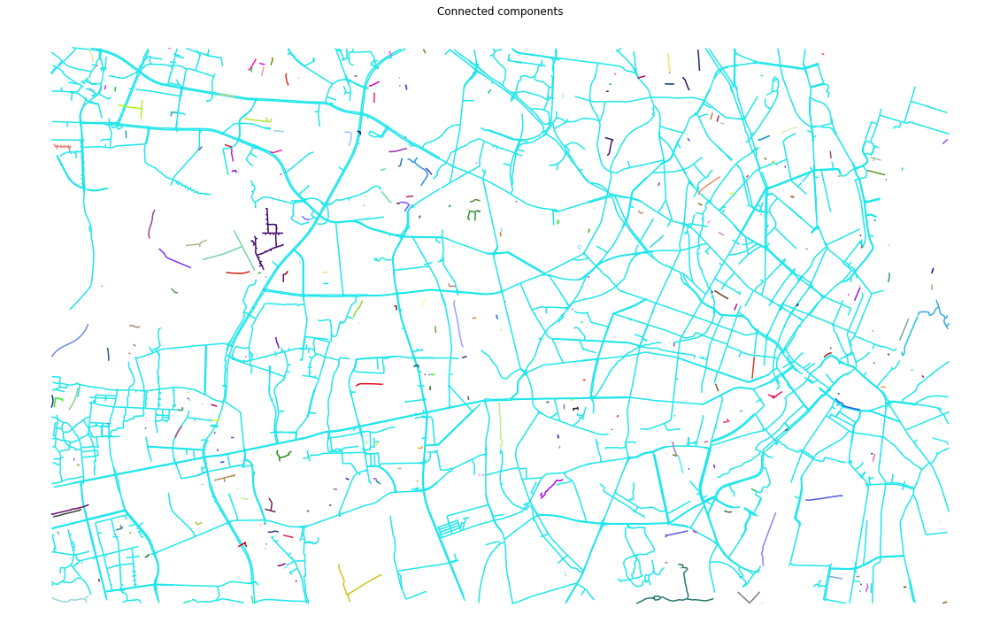

In [76]:
components = ef.return_components(ref_simplified_graph)
print(f'The network in the study area consists of {len(components)} unconnected components.')

components_plot = ef.plot_components(components)

**Distribution of network length per component:**

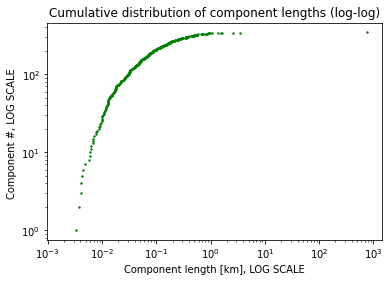

In [66]:
components_length = {}

for i, c in enumerate(components):

    c_length = 0

    for (u, v, l) in c.edges(data='length'):

        c_length += l
        
    components_length[i] = c_length

components_df = pd.DataFrame.from_dict(components_length, orient='index')

components_df.rename(columns={0:'component_length'}, inplace=True)

plt.scatter(
    x = sorted(list(components_df['component_length']/1000)),
    y = [i for i in range(len(components_df))], 
    s = 2,
    color = 'green'
)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Component length [km], LOG SCALE')
plt.ylabel('Component #, LOG SCALE ')
plt.title('Cumulative distribution of component lengths (log-log)');

In [67]:
largest_cc = max(components, key=len)

largest_cc_length = 0

for (u, v, l) in largest_cc.edges(data='length'):

        largest_cc_length += l

largest_cc_pct = largest_cc_length / components_df['component_length'].sum() * 100

print(f'The largest connected component contains {largest_cc_pct:.2f} % of the network length.')

The largest connected component contains 92.63 % of the network length.


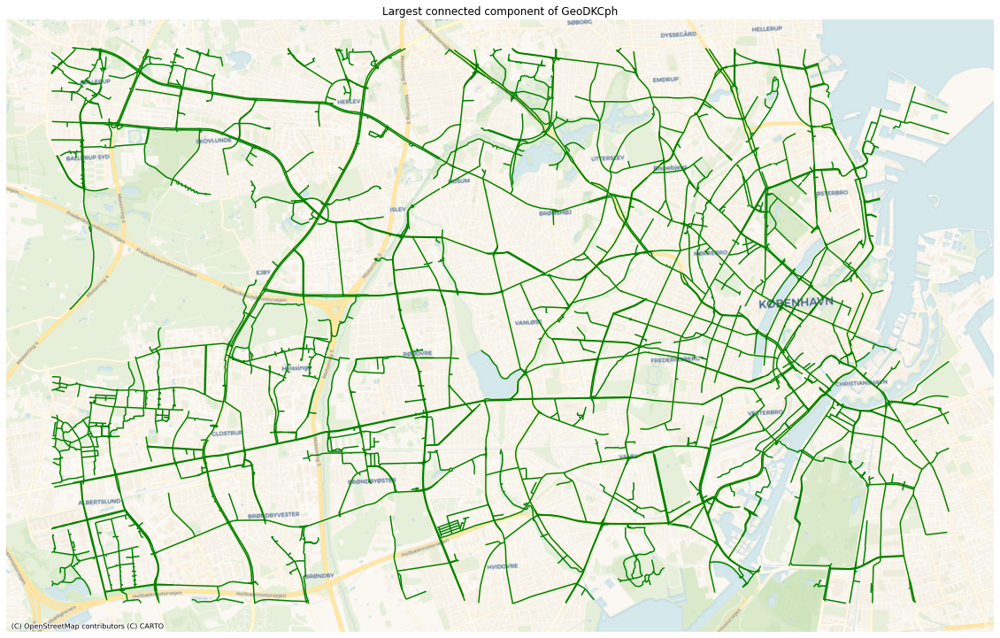

In [68]:
# Plot of largest connected component

lcc_edges = ox.graph_to_gdfs(
    G = largest_cc, 
    nodes = False, 
    edges = True, 
    node_geometry = False, 
    fill_edge_geometry = False)

fig, ax = plt.subplots(1, 1, figsize = (20,20))

lcc_edges.plot(ax = ax, color = 'green')
ax.set_axis_off()
ax.set_title('Largest connected component of ' + study_area)

cx.add_basemap(ax = ax, crs=study_crs, source=cx.providers.CartoDB.Voyager)

**Identifying potential missing links between unconnected components:**

In [72]:
component_issues, component_edges = ef.find_adjacent_components(
    components=components, 
    buffer_dist=10, 
    crs=study_crs, 
    edge_id='edge_id',
    return_edges=True
)

In [71]:
# Folium plot of adjacent components
# The map highlights edges in different components with less than the specified threshold length between them

simplified_edges_folium = pf.make_edgefeaturegroup(
    gdf = edges_simplified,
    mycolor = 'black',
    myweight = 2,
    nametag = 'All edges',
    show_edges = True
)

component_issues_folium = pf.make_edgefeaturegroup(
    gdf = component_issues,
    mycolor = 'red',
    myweight = 3,
    nametag = 'Component issues',
    show_edges = True
)

component_edges_folium = pf.make_edgefeaturegroup(
    gdf = component_edges,
    myweight = 2,
    mycolor = 'blue',
    nametag = 'Disconnected components',
    show_edges = False
)

m = pf.make_foliumplot(
    feature_groups = [
        simplified_edges_folium, 
        component_issues_folium,
        component_edges_folium],
    layers_dict = folium_layers,
    center_gdf = nodes_simplified,
    center_crs = nodes_simplified.crs
)

m.save('../results/plots/folium_componentissues_ref.html')

display(m)

In [73]:
components_results = {}
components_results['component_count'] = len(components)
components_results['largest_cc_pct_size'] = largest_cc_pct
components_results['largest_cc_pct_length'] = largest_cc_length
components_results['count_adjacent_issues'] = len(component_issues)

___________________

## 5. Save results

In [74]:
all_results = {}

all_results['network_density'] = density_results
all_results['count_overshoots'] = len(overshoots)
all_results['count_undershoots'] = len(undershoot_nodes)
all_results['dangling_node_cout'] = len(dangling_nodes)
all_results['simplification_outcome'] = simplification_results
all_results['component_analysis'] = components_results

with open(f'../results/ref_instrinsic_analysis_{study_area}.json', 'w') as outfile:
    json.dump(all_results, outfile)

# Save grid with results
with open(f'../results/grid_results_intrinsic_{study_area}_ref.pickle', 'wb') as f:
    pickle.dump(grid, f)